# Multiclass semantic segmentation using DeepLabV3+
- https://keras.io/examples/vision/deeplabv3_plus/
- https://learnopencv.com/deeplabv3-ultimate-guide/

## Dataset
Rellis-3D in **All labels (20 classes)**

https://arxiv.org/abs/1811.12596

## Guardar modelo, pesos y como reentrenar

https://www.tensorflow.org/tutorials/keras/save_and_load?hl=es-419

### Environment tf39

In [1]:
import os
import numpy as np
from glob import glob
import cv2
from scipy.io import loadmat
import matplotlib.pyplot as plt

import keras
from keras import layers
from keras import ops
from keras.applications.resnet import ResNet50
from keras.applications.resnet import preprocess_input

# For data preprocessing
import tensorflow as tf
from tensorflow import image as tf_image
from tensorflow import data as tf_data
from tensorflow import io as tf_io
import warnings
warnings.filterwarnings('ignore')


In [2]:
print(keras.__version__)
print(tf.__version__)

3.0.5
2.16.1


In [3]:
#!pip install tensorflow
!pip check tensorflow

No broken requirements found.


## Loading Rellis-3D Dataset


In [4]:
IMAGE_SIZE = 512
BATCH_SIZE = 4
NUM_CLASSES = 20
TRAIN_DIR = "./rellis20/train"
VALID_DIR = "./rellis20/val"
TEST_DIR = "./rellis20/test"

train_images = sorted(glob(os.path.join(TRAIN_DIR, "images/*")))
train_masks = sorted(glob(os.path.join(TRAIN_DIR, "labels/*")))
val_images = sorted(glob(os.path.join(VALID_DIR, "images/*")))
val_masks = sorted(glob(os.path.join(VALID_DIR, "labels/*")))
test_images = sorted(glob(os.path.join(TEST_DIR, "images/*")))
test_masks = sorted(glob(os.path.join(TEST_DIR, "labels/*")))
test_maskscolors = sorted(glob(os.path.join(TEST_DIR, "masks_colors/*")))

print(len(train_images))
print(len(train_masks))
print(len(val_images))
print(len(val_masks))
print(len(test_images))
print(len(test_masks))
print(len(test_maskscolors))

3302
3302
983
983
1672
1672
1672


In [5]:
print(train_masks[0])

./rellis20/train\labels\frame000000-1581624075_250_20.png


In [6]:
def read_image(image_path, mask=False):
    image = tf_io.read_file(image_path)
    if mask:
        image = tf_image.decode_png(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf_image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf_image.decode_png(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf_image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    return image


def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask


def data_generator(image_list, mask_list, batch_size):
    dataset = tf_data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf_data.AUTOTUNE)
    dataset = dataset.batch(batch_size, drop_remainder=True)
    return dataset

train_dataset = data_generator(train_images, train_masks,BATCH_SIZE)
val_dataset = data_generator(val_images, val_masks,BATCH_SIZE)
#test_dataset = data_generator(test_images, test_masks, 1)     # Batchsize=1

print("Train Dataset:", train_dataset)
print("Val Dataset:", val_dataset)
#print("Test Dataset:", test_dataset)

Train Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 512, 512, 1), dtype=tf.float32, name=None))>
Val Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 512, 512, 1), dtype=tf.float32, name=None))>
Test Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(1, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(1, 512, 512, 1), dtype=tf.float32, name=None))>


### Check the shape of GT masks id

In [7]:
# extract Gt mask id
path_gt_mask = test_masks[0]
gtmask0 = read_image(path_gt_mask, mask=True)
print(gtmask0.shape)

(512, 512, 1)


## Building the DeepLabV3+ model
**DeepLabv3+** amplía DeepLabv3 agregando una estructura codificador-decodificador (decoder-encoder). El módulo codificador procesa información contextual multiescala aplicando convolución dilatada en múltiples escalas, mientras que el módulo decodificador refina los resultados de la segmentación a lo largo de los límites del objeto.

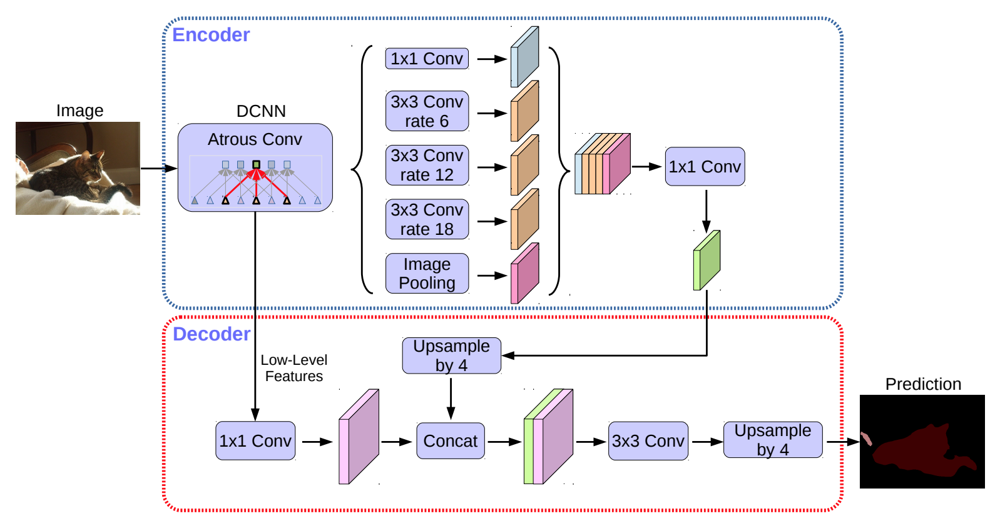

**Convolución dilatada**: con la convolución dilatada, a medida que profundizamos en la red, podemos mantener el paso constante pero con un campo de visión más amplio sin aumentar la cantidad de parámetros o la cantidad de cálculo. Además, permite mapas de características de salida más grandes, lo cual es útil para la segmentación semántica.

La razón para utilizar la **agrupación de pirámides espaciales dilatadas** es que se demostró que a medida que la tasa de muestreo aumenta, la cantidad de ponderaciones de filtro válidas (es decir, ponderaciones que se aplican a la región de características válida, en lugar de ceros rellenos) se reduce.

In [8]:
def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return ops.nn.relu(x)

def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]),
        interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

Las características del encoder primero se muestrean bilinealmente mediante un factor 4 y luego se concatenan con las características de bajo nivel correspondientes de la red troncal que tienen la misma resolución espacial. Para este ejemplo, utilizamos un ResNet50 previamente entrenado en ImageNet como modelo de red troncal y utilizamos las funciones de bajo nivel del bloque conv4_block6_2_relu de la red troncal.

In [9]:
def DeeplabV3Plus(image_size, num_classes):
    #model_input = keras.Input(shape=(image_size, image_size, 3))
    #preprocessed = preprocess_input(model_input)
    #resnet50 = ResNet50(weights="imagenet", include_top=False, input_tensor=preprocessed)

    model_input = keras.Input(shape=(image_size, image_size, 3))
    preprocess = tf.keras.layers.Lambda(lambda x:preprocess_input(x))(model_input)
    resnet50 = ResNet50(weights="imagenet", include_top=False, input_tensor=preprocess)
    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)
    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)
    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    return keras.Model(inputs=model_input, outputs=model_output)


model = DeeplabV3Plus(image_size=IMAGE_SIZE, num_classes=NUM_CLASSES)
#model.summary()

## Training with early stopping, saving model+weights for each epoch and tensorboard


Callbaks de keras para:
- crear checkpoints del modelo con sus pesos para cada época.
- añadir early stopping, cuando el modelo no aprenda durante 3 épocas consecutivas el entrenamiento se detiene
- tensorboard, vemos las gráficas accuracy y loss durante el entrenamiento

In [10]:
from keras import callbacks

checkpoint_filepath ='./checkpoint/rellis3D_20_1/checkpoint.model.keras'
tensorboard_filepath='./checkpoint/rellis3D_20_1/logs'
#checkpoint_filepath='./checkpoint/rellis3D_6/model.{epoch:02d}-{val_loss:.2f}.h5'

# This callback will stop the training when there is no improvement in
# the loss for 3 consecutive epochs --> patience = 3.
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='loss',  
    patience=3
)

# save the model and weights for each epoch
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_filepath,
    monitor="val_loss",
    verbose=0,
    save_best_only=False,
    save_weights_only=False,
    mode="min",
    save_freq="epoch",
    initial_value_threshold=None,
)

# histogram frequency for each epoch 
tensorboard = tf.keras.callbacks.TensorBoard(
    log_dir=tensorboard_filepath,
    write_graph=True,
    histogram_freq=1
)

mycallbacks = [
    early_stopping,
    model_checkpoint,
    tensorboard,
]



#### Compilar modelo
Entrenamos el modelo utilizando entropía cruzada categórica dispersa como función de pérdida y Adam como optimizador y learning rate dinámico

In [11]:
EPOCHS = 30

# loss function
loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss=loss,
    metrics=["accuracy"],
)


#### Train

In [12]:
history = model.fit(train_dataset, validation_data=val_dataset, epochs=EPOCHS, callbacks=[mycallbacks])

Epoch 1/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4460s 5s/step - accuracy: 0.9179 - loss: 0.2691 - val_accuracy: 0.4771 - val_loss: 18.6348
Epoch 2/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4421s 5s/step - accuracy: 0.9148 - loss: 0.2624 - val_accuracy: 0.6046 - val_loss: 15.9239
Epoch 3/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4465s 5s/step - accuracy: 0.9189 - loss: 0.2439 - val_accuracy: 0.6502 - val_loss: 1.9612
Epoch 4/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4452s 5s/step - accuracy: 0.9251 - loss: 0.2233 - val_accuracy: 0.6736 - val_loss: 1.5146
Epoch 5/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4453s 5s/step - accuracy: 0.9292 - loss: 0.2095 - val_accuracy: 0.7043 - val_loss: 2.2241
Epoch 6/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4469s 5s/step - accuracy: 0.9314 - loss: 0.2039 - val_accuracy: 0.4577 - val_loss: 3.0243
Epoch 7/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4476s 5s/step - accuracy: 0.9340 - loss: 0.1944 - val_accuracy: 0.5823 - val_loss: 1.5272
Epoch 8/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4465s 5s/step - accuracy: 0.9360 - loss: 0.1859 

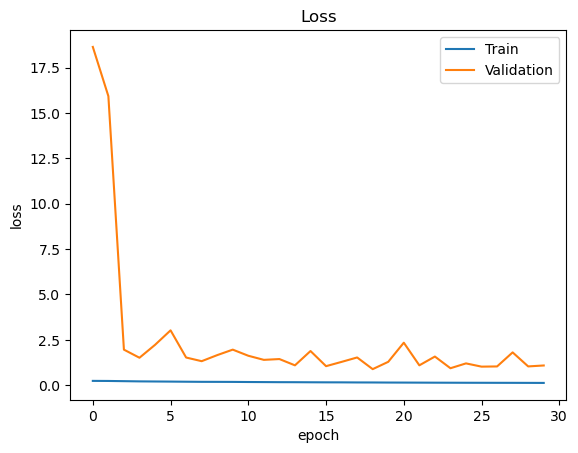

In [13]:
plt.plot(history.history["loss"], label = "Train")
plt.plot(history.history["val_loss"], label = "Validation")
plt.legend(loc = 'upper right')
plt.title("Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

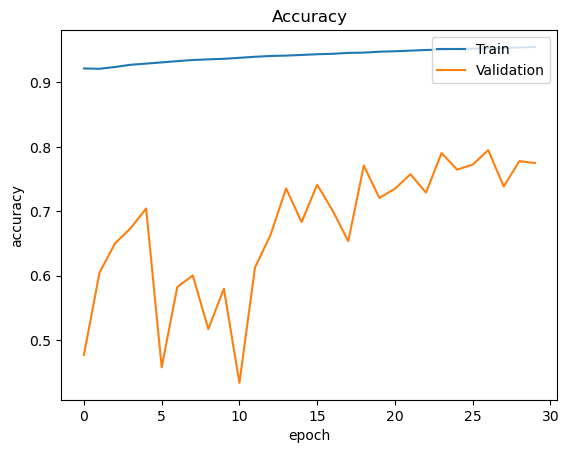

In [14]:
plt.plot(history.history["accuracy"], label = "Train")
plt.plot(history.history["val_accuracy"], label = "Validation")
plt.legend(loc = 'upper right')
plt.title("Accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.show()

## Guardar modelo completo y cargarlo en formato h5

In [15]:
model.save_weights('./model/Test7_model1.weights.h5')

In [ ]:
# model.load_weights('./model/Test7_model2.weights.h5')

## Guardar y Cargar modelo completo con tf.saved_model

In [16]:
tf.saved_model.save(model, './model/Test_7_Rellis20_1')

INFO:tensorflow:Assets written to: ./model/Test_7_Rellis20_1\assets


INFO:tensorflow:Assets written to: ./model/Test_7_Rellis20_1\assets


In [12]:
tf.saved_model.load('./model/Test_7_Rellis20_1')

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject at 0x20dccc9e940>

### Retrain model and save the best

In [17]:
EPOCHS=3
checkpoint_filepath ='./checkpoint/rellis3D_20_2/checkpoint.model.keras'
tensorboard_filepath='./checkpoint/rellis3D_20_2/logs'

# save the model and weights for each epoch
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_filepath,
    monitor="val_loss",
    verbose=0,
    save_best_only=True,
    save_weights_only=False,
    mode="min",
    save_freq="epoch",
    initial_value_threshold=None,
)

In [18]:
history = model.fit(train_dataset, validation_data=val_dataset, epochs=EPOCHS, callbacks=[mycallbacks])

Epoch 1/3
825/825 ━━━━━━━━━━━━━━━━━━━━ 4703s 6s/step - accuracy: 0.9610 - loss: 0.1133 - val_accuracy: 0.7781 - val_loss: 0.9928
Epoch 2/3
825/825 ━━━━━━━━━━━━━━━━━━━━ 4716s 6s/step - accuracy: 0.9615 - loss: 0.1121 - val_accuracy: 0.7633 - val_loss: 1.2573
Epoch 3/3
825/825 ━━━━━━━━━━━━━━━━━━━━ 4823s 6s/step - accuracy: 0.9618 - loss: 0.1111 - val_accuracy: 0.7901 - val_loss: 1.1711


In [19]:
model.save_weights('./model/Test7_model2.weights.h5')

In [20]:
tf.saved_model.save(model, './model/Test_7_Rellis20_2')

INFO:tensorflow:Assets written to: ./model/Test_7_Rellis20_2\assets


INFO:tensorflow:Assets written to: ./model/Test_7_Rellis20_2\assets


## Inferencia mediante superposición de mapa de colores
Las predicciones sin procesar del modelo representan un tensor de forma codificado en caliente (N, 512, 512, num_clases) donde cada uno de los num_clases (canales) es una máscara binaria correspondiente a una etiqueta predicha. Para visualizar los resultados, los trazamos como máscaras de segmentación RGB donde cada píxel está representado por un color único correspondiente a la etiqueta particular predicha. Podemos encontrar fácilmente el color correspondiente a cada etiqueta en el archivo human_colormap.mat proporcionado como parte del conjunto de datos. También trazaríamos una superposición de la máscara de segmentación RGB en la imagen de entrada, ya que esto nos ayuda a identificar las diferentes categorías presentes en la imagen de manera más intuitiva.

In [22]:
def infer(model, image_tensor):
    predictions = model.predict(np.expand_dims((image_tensor), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    return predictions


def decode_segmentation_masks(mask, colormap, n_classes):
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    for l in range(0, n_classes):
        idx = mask == l
        r[idx] = colormap[l, 0]
        g[idx] = colormap[l, 1]
        b[idx] = colormap[l, 2]
    rgb = np.stack([r, g, b], axis=2)
    return rgb


def get_overlay(image, colored_mask):
    image = keras.utils.array_to_img(image)
    image = np.array(image).astype(np.uint8)
    overlay = cv2.addWeighted(image, 0.35, colored_mask, 0.65, 0)
    return overlay


def plot_samples_matplotlib(display_list, figsize=(5, 3)):
    _, axes = plt.subplots(nrows=1, ncols=len(display_list), figsize=figsize)
    for i in range(len(display_list)):
        if display_list[i].shape[-1] == 3:
            axes[i].imshow(keras.utils.array_to_img(display_list[i]))
        else:
            axes[i].imshow(display_list[i])
    plt.show()


def plot_predictions(images_list, colormap, model):
    for image_file in images_list:
        image_tensor = read_image(image_file)
        prediction_mask = infer(image_tensor=image_tensor, model=model)
        #prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, 20)
        prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, NUM_CLASSES)
        overlay = get_overlay(image_tensor, prediction_colormap)
        plot_samples_matplotlib(
            [image_tensor, overlay, prediction_colormap], figsize=(18, 14)
        )
    

### Estudio del mapa de colores para que coincida con el del dataset original

In [28]:
IDs =    [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 17, 18, 19, 23, 27, 31, 33, 34]
Groups = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19)

# ORIGINAL DATASET
CLASSES = ("void", "dirt", "grass", "tree", "pole", "water", "sky", "vehicle", 
            "object", "asphalt", "building", "log", "person", "fence", "bush", 
            "concrete", "barrier", "puddle", "mud", "rubble")

PALETTE = np.array([[0, 0, 0], [108, 64, 20], [0, 102, 0], [0, 255, 0], [0, 153, 153], 
            [0, 128, 255], [0, 0, 255], [255, 255, 0], [255, 0, 127], [64, 64, 64], 
            [255, 0, 0], [102, 0, 0], [204, 153, 255], [102, 0, 204], [255, 153, 204], 
            [170, 170, 170], [41, 121, 255], [134, 255, 239], [99, 66, 34], [110, 22, 138]])

print(type(PALETTE))
print(PALETTE)


<class 'numpy.ndarray'>
[[  0   0   0]
 [108  64  20]
 [  0 102   0]
 [  0 255   0]
 [  0 153 153]
 [  0 128 255]
 [  0   0 255]
 [255 255   0]
 [255   0 127]
 [ 64  64  64]
 [255   0   0]
 [102   0   0]
 [204 153 255]
 [102   0 204]
 [255 153 204]
 [170 170 170]
 [ 41 121 255]
 [134 255 239]
 [ 99  66  34]
 [110  22 138]]


## Inferencia en conjunto Train - con superposición de mapa de colores sobre RGB

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


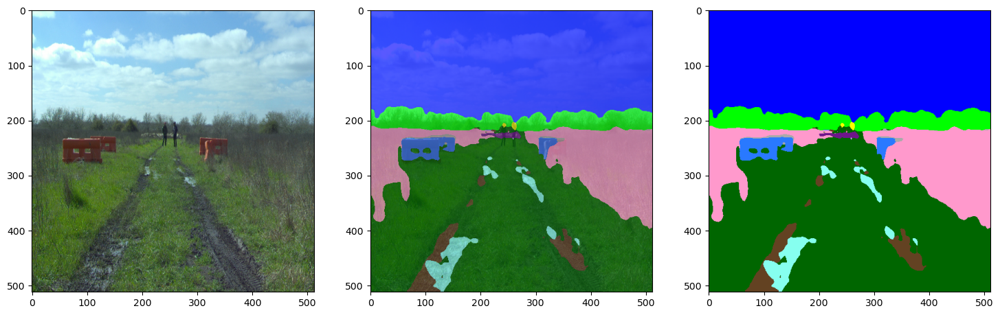

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


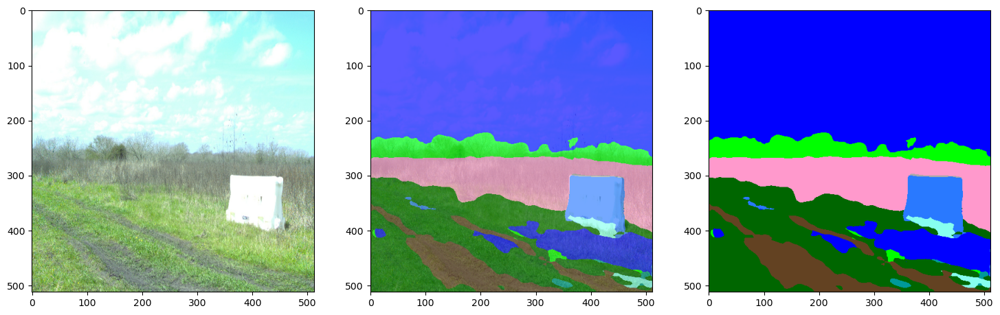

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


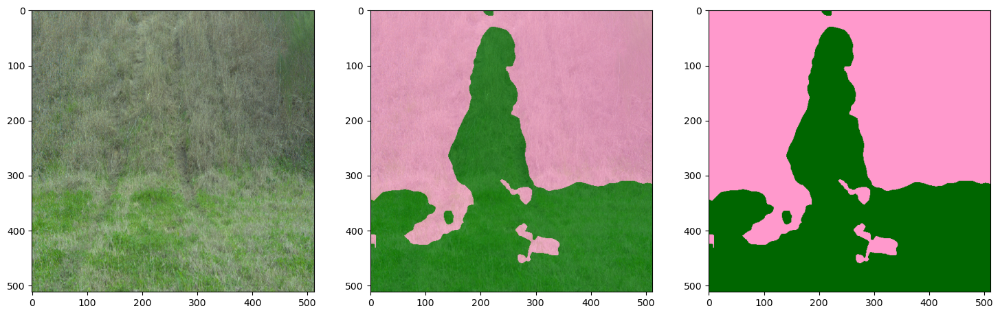

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


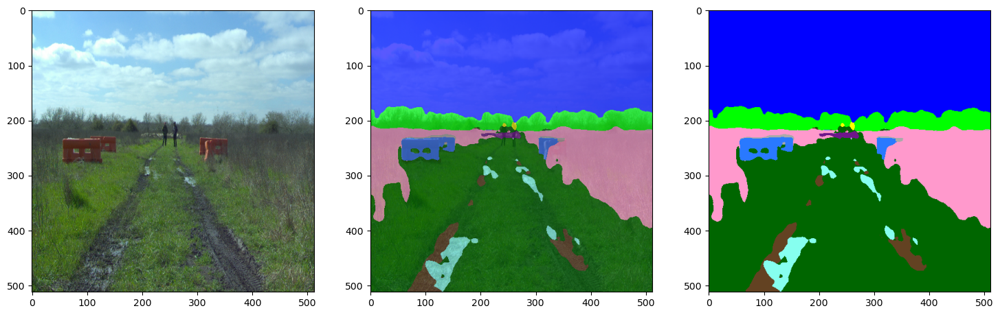

In [23]:
plot_predictions(train_images[:4], PALETTE, model=model)

## Inferencia en conjunto Test - con superposición de mapa de colores sobre RGB
Puede utilizar el modelo entrenado alojado en Hugging Face Hub y probar la demostración en Hugging Face Spaces.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


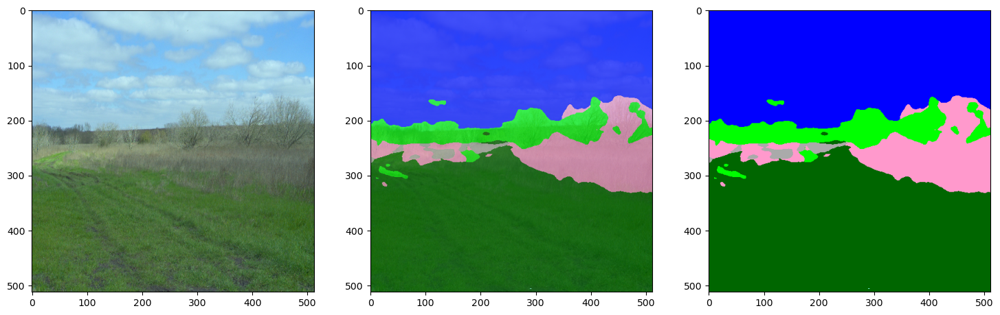

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


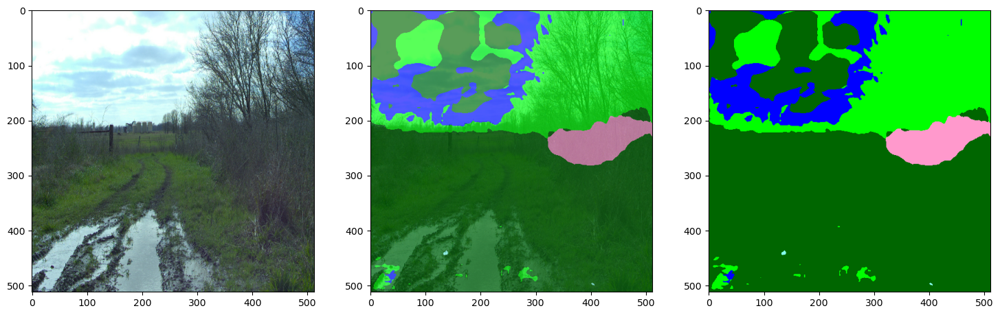

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


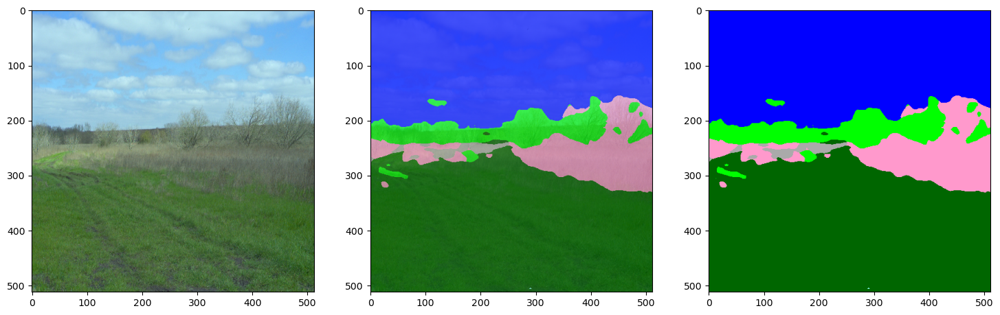

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


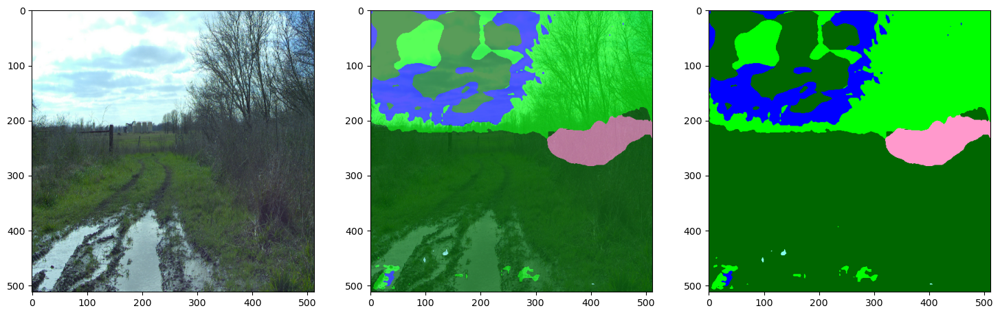

In [24]:
plot_predictions(test_images[:4], PALETTE, model=model)

## Guardar modelo con predicciones

In [24]:
# tf.saved_model.save(model, './model/Test_4.2_RDeepLabV3+_Rellis20_pred')

INFO:tensorflow:Assets written to: ./model/Test3_RDeepLabV3+_RellisAll_pred\assets


INFO:tensorflow:Assets written to: ./model/Test3_RDeepLabV3+_RellisAll_pred\assets


## Inferencia comparando la máscara GT RGB con la predicción convertida a RGB con mapa de colores

#### Conjunto de test cargado anteriormente
- test_images = sorted(glob(os.path.join(TEST_DIR, "images/*")))
- test_masks = sorted(glob(os.path.join(TEST_DIR, "labels/*")))
- test_maskscolors = sorted(glob(os.path.join(TEST_DIR, "masks_colors/*")))

In [25]:
# Seleccionar imágenes RGB del conjunto de test
for filename in test_images[:4]:
    print(filename)

./rellis20/test\images\frame000000-1581623790_349.jpg
./rellis20/test\images\frame000000-1581624652_750.jpg
./rellis20/test\images\frame000002-1581623790_549.jpg
./rellis20/test\images\frame000002-1581624652_949.jpg


In [33]:
# Seleccionar máscaras ID del conjunto de test
for filename in test_masks[:4]:
    print(filename)

./rellis20/test\labels\frame000000-1581623790_349_20.png
./rellis20/test\labels\frame000000-1581624652_750_20.png
./rellis20/test\labels\frame000002-1581623790_549_20.png
./rellis20/test\labels\frame000002-1581624652_949_20.png


In [32]:
for filename in test_maskscolors[:4]:
    print(filename)

./rellis20/test\masks_colors\frame000000-1581623790_349.png
./rellis20/test\masks_colors\frame000000-1581624652_750.png
./rellis20/test\masks_colors\frame000002-1581623790_549.png
./rellis20/test\masks_colors\frame000002-1581624652_949.png


In [38]:
# Predicción de MaskID - Mostrar RGB vs GT MaskID original vs Predicción maskID
def plot_MaskID_GTvsPred(images_list, mask_id, model):
    aux=0
    for image_file in images_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        mask_id_gt = read_image(mask_id[aux], mask=True)                 # Ground Truth MaskID
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        
        #prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, NUM_CLASSES)
        #overlay = get_overlay(image_tensor, prediction_colormap)
        plot_samples_matplotlib(
            [image_tensor, mask_id_gt, pred_mask_id], figsize=(18, 14)
        )
        aux+=1
        
# Predicción de MaskColor - Mostrar RGB vs GT MaskColor vs Predicción maskID superpuesta con mapa de colores
def plot_MaskColor_GTvsPred(images_list, mask_color, model):
    aux=0
    for image_file in images_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        mask_color_gt = read_image(mask_color[aux])                      # Ground Truth MaskColor
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        pred_mask_color = decode_segmentation_masks(pred_mask_id, PALETTE, NUM_CLASSES)   # Convert predicted maskID to maskcolor

        plot_samples_matplotlib(
            [image_tensor, mask_color_gt, pred_mask_color], figsize=(18, 14)
        )
        aux+=1
     

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


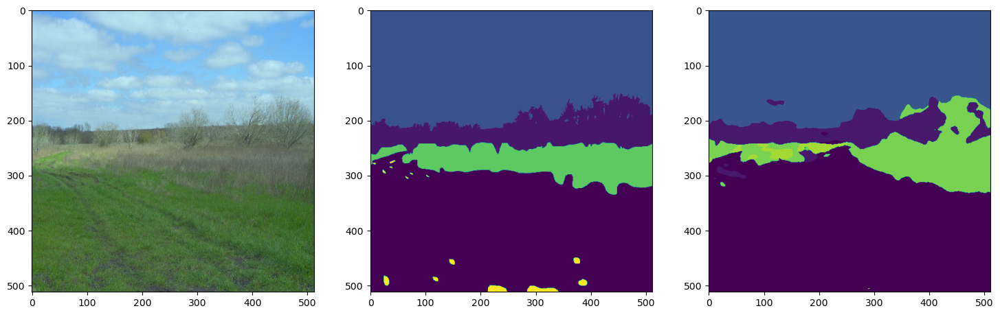

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


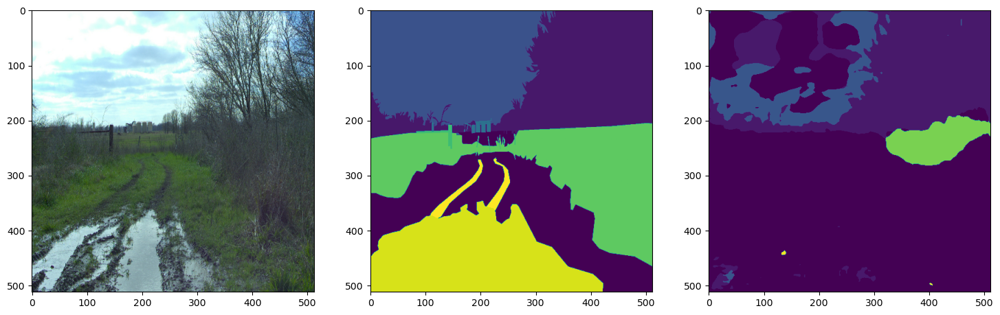

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


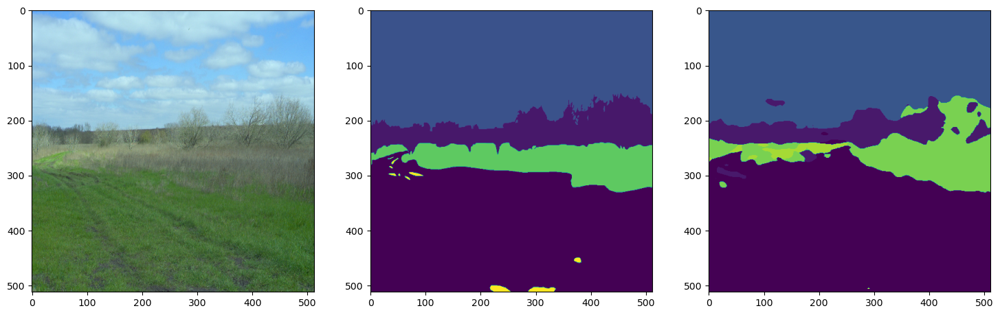

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


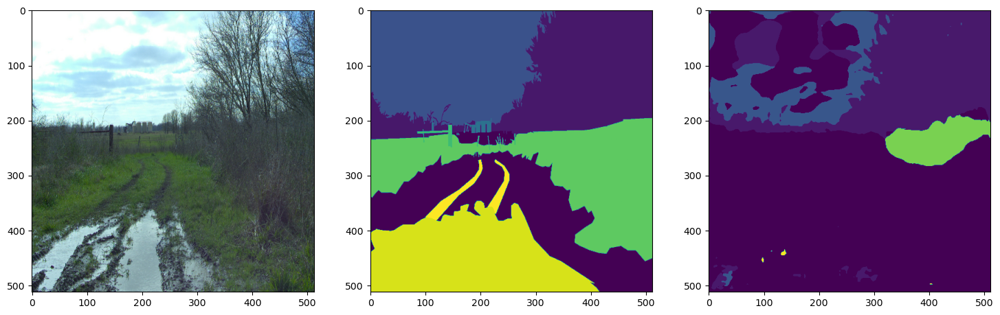

In [39]:
plot_MaskID_GTvsPred(test_images[:4], test_masks[:4], model=model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


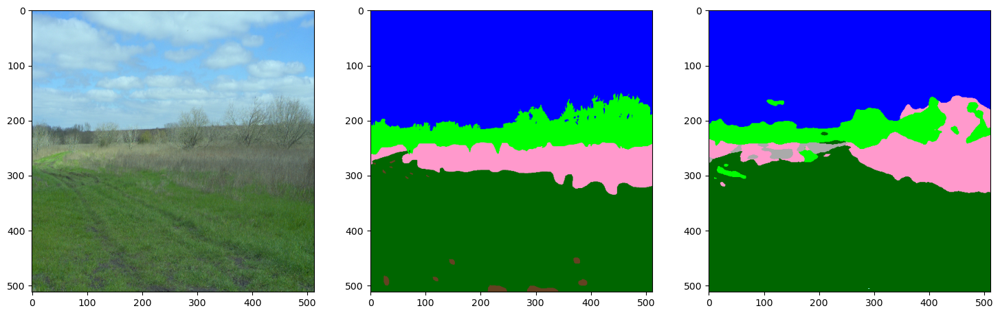

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


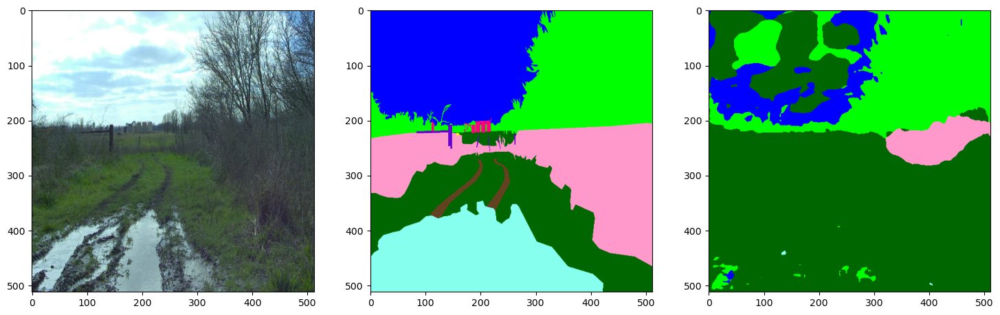

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


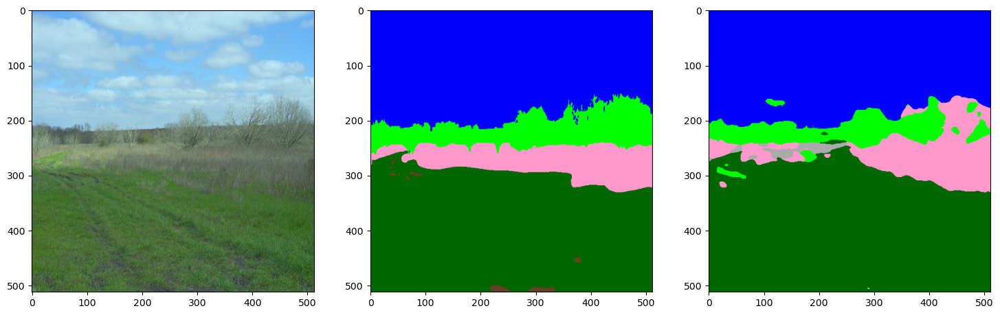

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


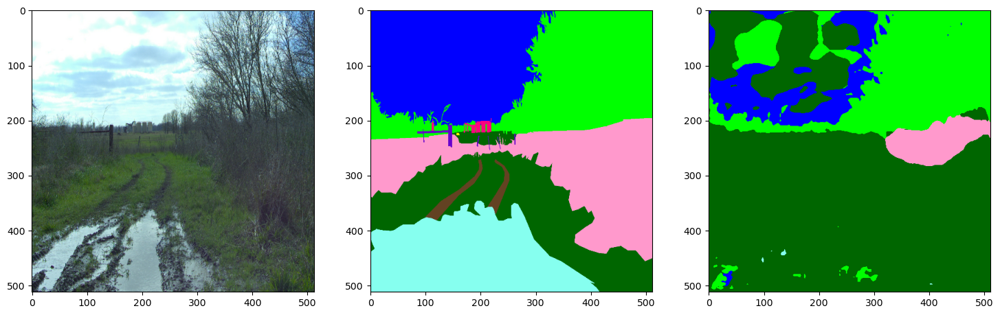

In [40]:
plot_MaskColor_GTvsPred(test_images[:4], test_maskscolors[:4], model=model)

## Inferencia en conjunto de Test completo

In [42]:
def inference_maskID(RGB_image_list, model):
    aux=0
    pred_masks_id=[]
    for image_file in RGB_image_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        pred_masks_id.append(pred_mask_id)
        aux+=1
    return pred_masks_id

def inference_maskColor(RGB_image_list, model):
    aux=0
    pred_masks_color=[]
    for image_file in RGB_image_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        pred_mask_color = decode_segmentation_masks(pred_mask_id, PALETTE, NUM_CLASSES)   # Convert predicted maskID to maskcolor
        pred_masks_color.append(pred_mask_color)
        aux+=1
    return pred_masks_color

In [ ]:
pred_masksID = inference_maskID(test_images, model)
pred_masksColor = inference_maskColor(test_images,model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

### Check the RGB and masks image shapes

In [226]:
# RGB Test image
RGB0 = read_image(test_images[0])   
print(RGB0.shape)

# Test GT maskID
maskID0 = read_image(test_masks[0], mask=True)   
print(maskID0.shape)

# Test GT maskColor
maskColor0 = read_image(test_maskscolors[0])
print(maskColor0.shape)

# Predicted test maskID
print(pred_masksID[0].shape)

# Predicted test maskColor
print(pred_masksColor[0].shape)

(512, 512, 3)
(512, 512, 1)
(512, 512, 3)
(512, 512)
(512, 512, 3)


In [231]:
# first image
maskID = read_image(test_masks[0], mask=True)   
y_true = np.reshape(maskID,(512,512,1))
y_pred=pred_masksID[0]
y_pred = np.reshape(y_pred,(512,512,1))

# 2 image
#maskID = read_image(test_masks[2], mask=True)   
#y_true = np.reshape(maskID,(512,512))
#y_pred=pred_masksID[2]

print(y_true.shape)
print(y_pred.shape)

(512, 512, 1)
(512, 512, 1)


In [232]:
def miou_and_mDice(y_true, y_pred):
    intersection = np.sum(np.logical_and(y_true, y_pred))
    union = np.sum(np.logical_or(y_pred, y_true))
    iou = np.mean((intersection)/union)
    dice = 2*np.mean(intersection/(np.sum(y_pred)+np.sum(y_true)))
    return iou, dice

In [233]:
mIoU, mDice = miou_and_mDice(y_true, y_pred)
print(mIoU)
print(mDice)

1.0
0.2033036533451836


In [234]:
Y_true = one_hot_encode(y_true, IDs)
Y_pred = one_hot_encode(y_pred, IDs)
print(Y_true.shape)
print(Y_pred.shape)

(512, 512, 20)
(512, 512, 20)


In [235]:
mIoU, mDice = miou_and_mDice(Y_true, Y_pred)
print(mIoU)
print(mDice)

0.8686892253966343
0.9297310795081538


#### Comprobar que GT vs GT es 1

In [197]:
mIoU, mDice = miou_and_mDice(Y_true, Y_true)
print(mIoU)
print(mDice)

mIoU, mDice = miou_and_mDice(Y_pred, Y_pred)
print(mIoU)
print(mDice)

1.0
1.0
1.0
1.0


### Pruebas

In [198]:
# Test GT maskID
maskID0 = read_image(test_masks[0], mask=True)   
print(maskID0.shape)

# Predicted maskID
ypred = np.reshape(pred_masksID[0],(512,512,1))
print(ypred.shape)

# OneHot encode
y_true = one_hot_encode(maskID0, IDs)
y_pred = one_hot_encode(ypred, IDs)
print(y_true.shape)
print(y_pred.shape)

(512, 512, 1)
(512, 512, 1)
(512, 512, 20)
(512, 512, 20)


In [209]:
mIouListGT=[]
mDiceListGT=[]
for i in range(0, 20):
    ytrue = y_true[:,:,i]
    ypred = y_pred[:,:,i]
    mIoU, mDice = miou_and_mDice(ytrue, ytrue)
    if np.isnan(mIoU) == True:  mIoU=0.
    if np.isnan(mDice) == True: mDice=0.
    mIouListGT.append(mIoU)
    mDiceListGT.append(mDice)

print(mIouListGT)
print(mDiceListGT)

[0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


In [216]:
mIouList=[]
mDiceList=[]
for i in range(0, 20):
    ytrue = y_true[:,:,i]
    ypred = y_pred[:,:,i]
    mIoU, mDice = miou_and_mDice(ytrue, ypred)
    if np.isnan(mIoU) == True:  mIoU=0.
    if np.isnan(mDice) == True: mDice=0.
    mIouList.append(mIoU)
    mDiceList.append(mDice)

print(mIouList)
print(mDiceList)

[0.0, 0.0, 0.5988861676787332, 0.0, 0.0, 0.9810467045397416, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.749129212304335, 0.0, 0.0, 0.990432686207334, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


In [213]:
mIou_loss = [e1 - e2 for e1, e2 in zip(mIouListGT,mIouList)]           # mIouListGT - mIouList
mdice_loss =[e1 - e2 for e1, e2 in zip(mDiceListGT,mDiceList)]         # mDiceListGT- mDiceList

print(mIou_loss)
print(mdice_loss)

[0.0, 0.0, 0.40111383232126685, 1.0, 0.0, 0.018953295460258368, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.25087078769566495, 1.0, 0.0, 0.009567313792665955, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


## Métricas
#### Metrica IoU

**Formula**
- iou = true_positives / (true_positives + false_positives + false_negatives)

In [52]:
## IOU in pure numpy
def numpy_iou(y_true, y_pred, n_class):
    def iou(y_true, y_pred, n_class):
        # IOU = TP/(TP+FN+FP)
        IOU = []
        for c in range(n_class):
            TP = np.sum((y_true == c) & (y_pred == c))
            FP = np.sum((y_true != c) & (y_pred == c))
            FN = np.sum((y_true == c) & (y_pred != c))

            n = TP
            d = float(TP + FP + FN + 1e-12)

            iou = np.divide(n, d)
            IOU.append(iou)

        return np.mean(IOU)

    batch = y_true.shape[0]
    y_true = np.reshape(y_true, (batch, -1))
    y_pred = np.reshape(y_pred, (batch, -1))

    score = []
    for idx in range(batch):
        iou_value = iou(y_true[idx], y_pred[idx], n_class)
        score.append(iou_value)
    return np.mean(score)

In [53]:
# IDs =    [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 17, 18, 19, 23, 27, 31, 33, 34]
# Groups = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19)

# ORIGINAL DATASET
# CLASSES = ("void", "dirt", "grass", "tree", "pole", "water", "sky", "vehicle", 
#            "object", "asphalt", "building", "log", "person", "fence", "bush", 
#            "concrete", "barrier", "puddle", "mud", "rubble")


In [54]:
mask0 = [(pred_masksID[0] == 0) ]
bg_mask = np.stack(mask0, axis=-1).astype('float')
print(bg_mask.shape)


(512, 512, 1)


In [55]:
mask = [(pred_masksID[0] == v) for v in IDs]
mask = np.stack(mask, axis=-1).astype('float')
print(mask.shape)

(512, 512, 20)


In [58]:
voi_maskID = mask[:,:,0]
dir_maskID = mask[:,:,1]
gra_maskID = mask[:,:,2]
tre_maskID = mask[:,:,3]
pol_maskID = mask[:,:,4]
wat_maskID = mask[:,:,5]
sky_maskID = mask[:,:,6]
ve_maskID = mask[:,:,7]
obj_maskID = mask[:,:,8]
asp_maskID = mask[:,:,9]
bui_maskID = mask[:,:,10]
log_maskID = mask[:,:,11]
per_maskID = mask[:,:,12]
fen_maskID = mask[:,:,13]
bus_maskID = mask[:,:,14]
con_maskID = mask[:,:,15]
bar_maskID = mask[:,:,16]
pud_maskID = mask[:,:,17]
mud_maskID = mask[:,:,18]
rub_maskID = mask[:,:,19]
print(v_maskID.shape)

(512, 512)


In [62]:
for i in range(0, len(IDs)):
    mean_iou=numpy_iou(maskID0, pred_masksID[0], IDs[i])
    print(mean_iou)

nan
0.0
0.14375346886779816
0.13101989048814122
0.10481591239051297
0.08734659365876081
0.1328870384148936
0.11627615861303191
0.10335658543380616
0.09302092689042553
0.0775174390753546
0.06903116433116932
0.06090985088044353
0.057525970275974454
0.05449828762987054
0.0450203245638061
0.038350646850649636
0.033402176289275484
0.03137780196871333
0.030454925440221766


In [86]:
print(len(test_masks))

1672


In [87]:
import pandas as pd

df = pd.DataFrame(columns=CLASSES)
mean_iou_row=[] 
id=0                     # maskID

for i, test_mask in enumerate(test_masks):
    GT_mask = read_image(test_mask, mask=True)
    pred_mask = pred_masksID[i]
    for indx in range(0, len(IDs)):
        mean_iou=numpy_iou(GT_mask, pred_mask, IDs[indx])
        if np.isnan(mean_iou) == True:  mean_iou=0.       # Check if mean_iou is NaN p.e in void class
        mean_iou_row.append(mean_iou)                     # Create a list with meanIou for each class
    df.loc[len(df)] = mean_iou_row                        # Save in a new row the list of meanIou for each image
    del(mean_iou_row)
    mean_iou_row = []


In [88]:
print(df)
df.to_csv('Pred_Rellis20_M1.csv') 

      void  dirt     grass      tree      pole     water       sky   vehicle  \
0      0.0   0.0  0.143753  0.131020  0.104816  0.087347  0.132887  0.116276   
1      0.0   0.0  0.062628  0.132935  0.106348  0.088623  0.098814  0.086462   
2      0.0   0.0  0.146128  0.132431  0.105945  0.088288  0.133834  0.117105   
3      0.0   0.0  0.062992  0.135038  0.108030  0.090025  0.100092  0.087580   
4      0.0   0.0  0.138931  0.127062  0.101649  0.084708  0.130860  0.114502   
...    ...   ...       ...       ...       ...       ...       ...       ...   
1667   0.0   0.0  0.151380  0.166469  0.133175  0.110979  0.159350  0.139431   
1668   0.0   0.0  0.151982  0.158107  0.126486  0.105405  0.154315  0.135026   
1669   0.0   0.0  0.151410  0.156617  0.125294  0.104412  0.153654  0.134447   
1670   0.0   0.0  0.150901  0.168189  0.134551  0.112126  0.160165  0.140145   
1671   0.0   0.0  0.151037  0.155962  0.124770  0.103975  0.153149  0.134006   

        object   asphalt  building     

In [ ]:
# Perform one hot encoding on label
def one_hot_encode(label, label_values):
    """
    Convert a segmentation image label array to one-hot format
    by replacing each pixel value with a vector of length num_classes
    # Arguments
        label: The 2D array segmentation image label
        label_values
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of num_classes
    """
    semantic_map = []
    for colour in label_values:
        equality = np.equal(label, colour)
        class_map = np.all(equality, axis = -1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)

    return semantic_map
    
# Perform reverse one-hot-encoding on labels / preds
def reverse_one_hot(image):
    """
    Transform a 2D array in one-hot format (depth is num_classes),
    to a 2D array with only 1 channel, where each pixel value is
    the classified class key.
    # Arguments
        image: The one-hot format image 
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of 1, where each pixel value is the classified 
        class key.
    """
    x = np.argmax(image, axis = -1)
    return x

In [93]:
from sklearn.metrics import jaccard_score

In [107]:
# Test GT maskID
maskID0 = read_image(test_masks[0], mask=True)   
print(maskID0.shape)

predmasksID = np.reshape(pred_masksID[0],(512,512,1))
print(predmasksID.shape)

maskID0=one_hot_encode(maskID0, IDs)
predmasksID=one_hot_encode(predmasksID, IDs)
print(maskID0.shape)
print(predmasksID.shape)

(512, 512, 1)
(512, 512, 1)
(512, 512, 20)
(512, 512, 20)


In [111]:
def mean_iou(y_true, y_pred): #one_hot_encode format
    y_pred = tf.round(tf.cast(y_pred, tf.int32))
    intersect = tf.reduce_sum(tf.cast(y_true, tf.float32) * tf.cast(y_pred, tf.float32), axis=[1])   
    union = tf.reduce_sum(tf.cast(y_true, tf.float32),axis=[1]) + tf.reduce_sum(tf.cast(y_pred, tf.float32),axis=[1])
    smooth = tf.ones(tf.shape(intersect))
    return tf.reduce_mean((intersect + smooth) / (union - intersect + smooth))

In [115]:
miou=mean_iou(maskID0,predmasksID)
print(miou)

tf.Tensor(0.9791878, shape=(), dtype=float32)


In [114]:
# Test GT maskID
maskID1 = read_image(test_masks[1], mask=True)   
print(maskID1.shape)

predmasksID1 = np.reshape(pred_masksID[1],(512,512,1))
print(predmasksID1.shape)

maskID1=one_hot_encode(maskID1, IDs)
predmasksID1=one_hot_encode(predmasksID1, IDs)
print(maskID1.shape)
print(predmasksID1.shape)

(512, 512, 1)
(512, 512, 1)
(512, 512, 20)
(512, 512, 20)


In [116]:
miou=mean_iou(maskID1,predmasksID1)
print(miou)

tf.Tensor(0.9454363, shape=(), dtype=float32)
